In [1]:
import os
os.chdir("Y:\Python\Mega_IT\F.Machine_Learning/2.Unsupervised_Learning/1.KMeans")
os.getcwd()

'Y:\\Python\\Mega_IT\\F.Machine_Learning\\2.Unsupervised_Learning\\1.KMeans'

In [2]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
import pandas as pd

In [3]:
from hossam.util import *
from hossam.plot import *
from hossam.analysis import *

### 문제 1

In [4]:
origin1 = pd.read_excel("./data/customer.xlsx")
origin1.head()

,고객ID,성별,나이,연수입,지출점수
0,1,Male,19,15,39
1,2,Male,21,15,81
2,3,Female,20,16,6
3,4,Female,23,16,77
4,5,Female,31,17,40


- 명목형 변수인 성별을 사용할지 여부에 따라 군집분석을 따로 실행 (라벨링 처리)

#### 성별 사용

In [5]:
df1_1 = origin1.copy()
df1_1['성별'] = df1_1['성별'].apply(lambda x : 1 if x == 'Male' else 0)
df1_1.drop('고객ID', axis = 1, inplace = True)

df1_2 = my_minmax_scaler(df1_1)

df1_2.head()

,성별,나이,연수입,지출점수
0,1.0,0.019231,0.000000,0.387755
1,1.0,0.057692,0.000000,0.816327
2,0.0,0.038462,0.008197,0.051020
3,0.0,0.096154,0.008197,0.775510
4,0.0,0.250000,0.016393,0.397959


##### Elbow Method

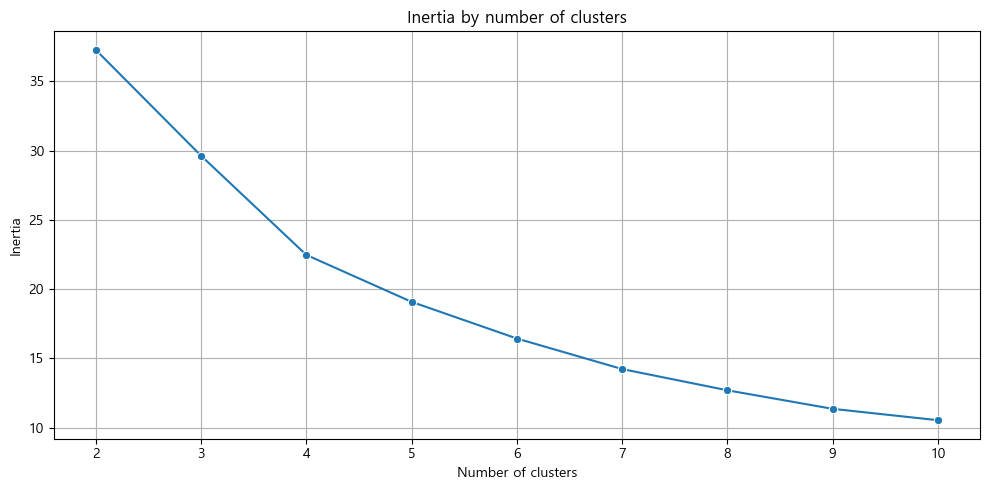

In [6]:
klist = list(range(2, 11))
inertia = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df1_2)
    inertia.append(estimator.inertia_)

def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

In [7]:
change_rates = [0]
for i in range(1, len(inertia)):
    change_rate = (inertia[i] - inertia[i-1]) / inertia[i-1]
    change_rates.append(change_rate)

avg_change_rate = np.mean(change_rates)

elbow_point = next((i for i, rate in enumerate(change_rates) if rate < avg_change_rate), None)

best_k = klist[elbow_point]
best_k

3

In [8]:
change_rates

[0,
 -0.20497644864233644,
 -0.24169198106741255,
 -0.1508076735345151,
 -0.13872803883142862,
 -0.13418356518126193,
 -0.10775482712658123,
 -0.10549597507402722,
 -0.07221302005972613]

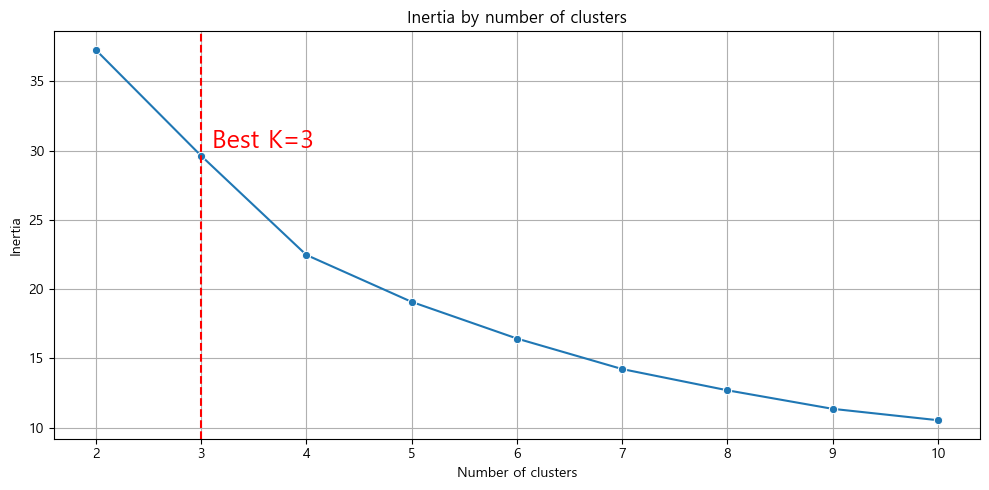

In [9]:
def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')
    ax.axvline(x=klist[elbow_point], color='r', linestyle='--')

    ax.text(
        best_k+0.1, inertia[elbow_point]+0.1, "Best K=%d" % best_k, fontsize=18, ha="left", va="bottom", color="r"
    )

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

- 3이 최적의 K값으로 산출되었으나 4의 경우에도 Elbow point로 사용할 여지는 있다

##### 실루엣 스코어

In [10]:
estimator = KMeans(n_clusters=3, random_state=0)
estimator.fit(df1_2)
silhouette_samples(df1_2, labels=estimator.predict(df1_2), metric='euclidean')[:5]

array([0.28708448, 0.43497759, 0.39836159, 0.45264966, 0.53613095])

In [11]:
silhouette_score(df1_2, labels=estimator.predict(df1_2), metric='euclidean')

0.45632990097013176

In [12]:
def visualize_silhouette(estimator, X_features, cluster_labels, n_cluster): 
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(18, 7))

    sil_avg = silhouette_score(X=X_features, labels=cluster_labels)
    sil_values = silhouette_samples(X=X_features, labels=cluster_labels)

    y_lower = 10
    plt.suptitle('Number of Cluster : '+ str(n_cluster)+', ' \
                        'Silhouette Score :' + str(round(sil_avg,3)) )
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X_features) + (n_cluster + 1) * 10])
    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

    # 클러스터링 갯수별로 fill_betweenx( )형태의 막대 그래프 표현. 
    for i in range(n_cluster):
        ith_cluster_sil_values = sil_values[cluster_labels==i]
        ith_cluster_sil_values.sort()

        size_cluster_i = ith_cluster_sil_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_cluster)
        ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_sil_values, \
                            facecolor=color, edgecolor=color, alpha=0.7)
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.axvline(x=sil_avg, color="red", linestyle="--")


      # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_cluster)
    ax2.scatter(
        X_features[X_features.columns[0]], X_features[X_features.columns[1]], marker="o", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = estimator.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="r",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.show()
    plt.close()

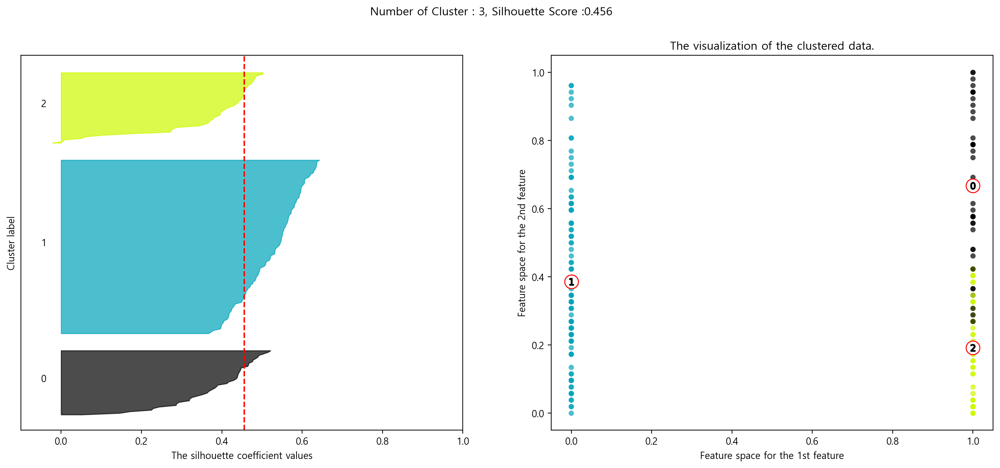

In [13]:
estimator = KMeans(n_clusters=best_k, random_state=0)
estimator.fit(df1_2)

visualize_silhouette(estimator=estimator, X_features=df1_2, cluster_labels=estimator.predict(df1_2), n_cluster=klist[elbow_point])

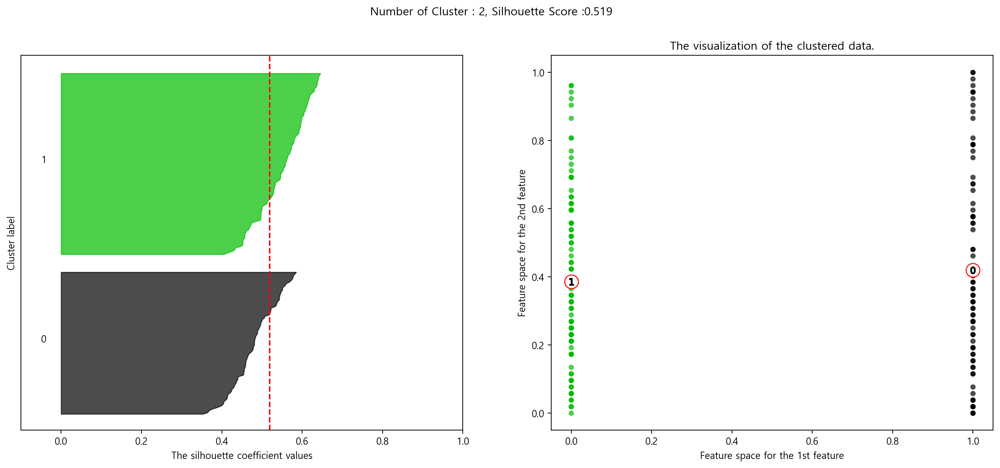

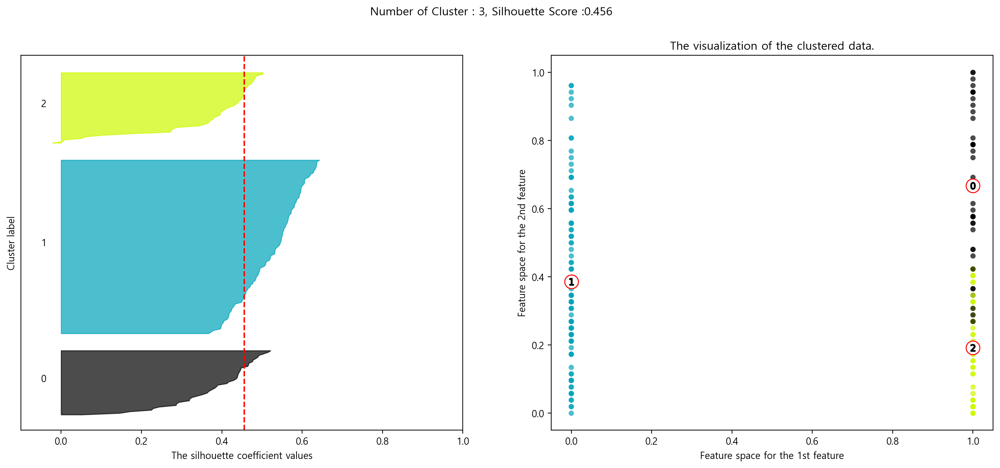

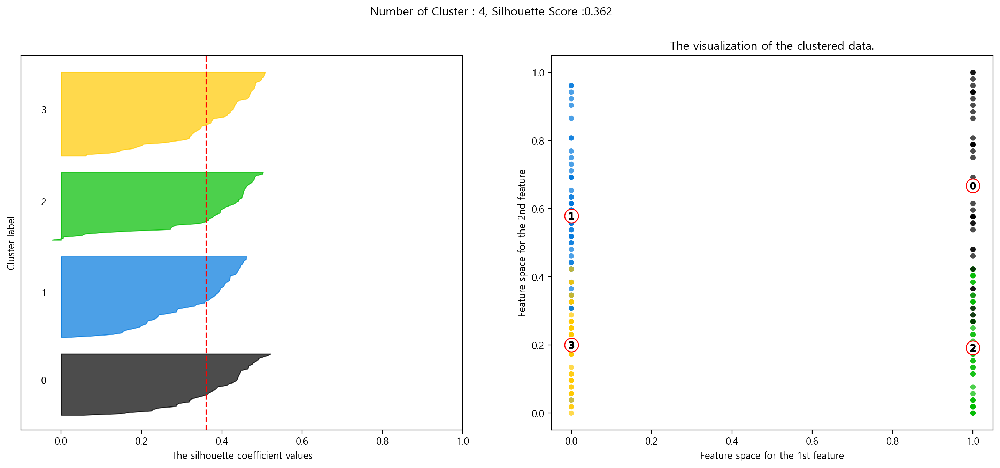

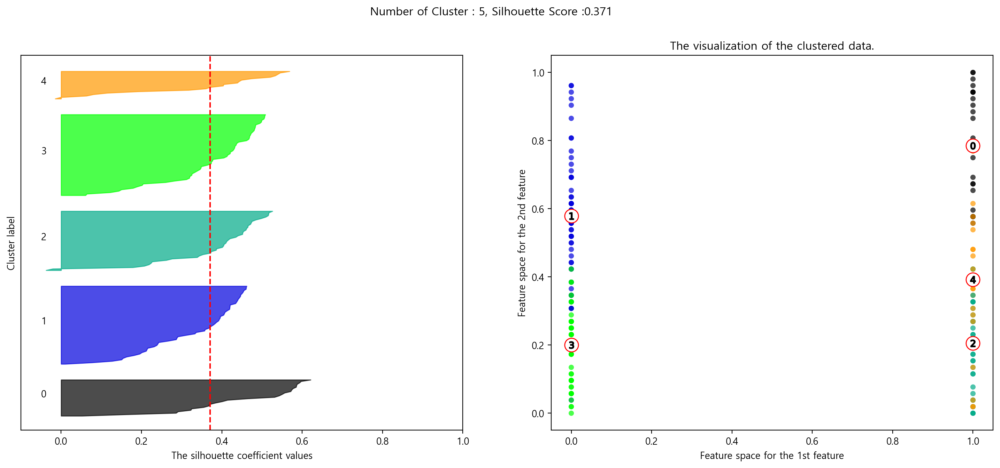

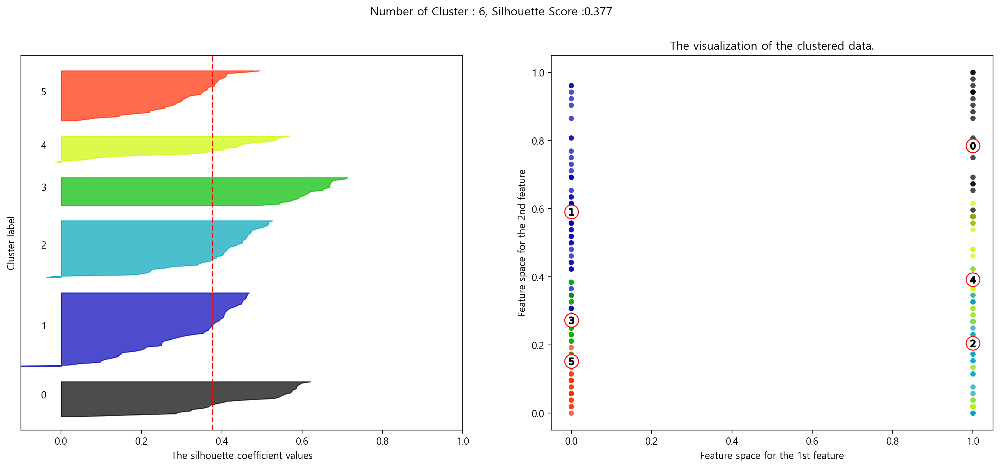

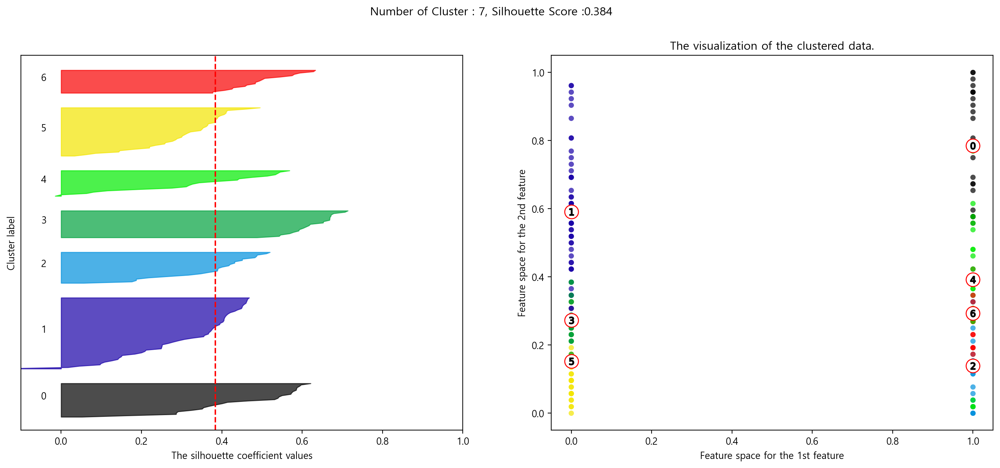

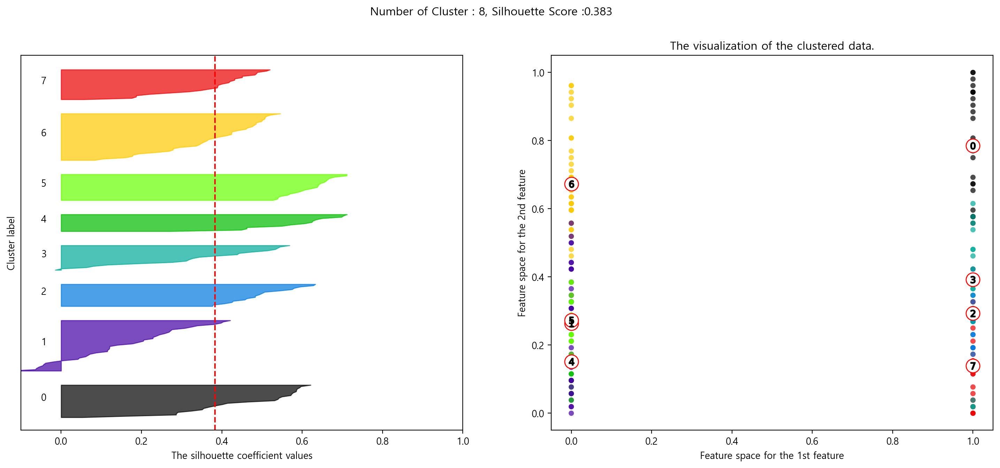

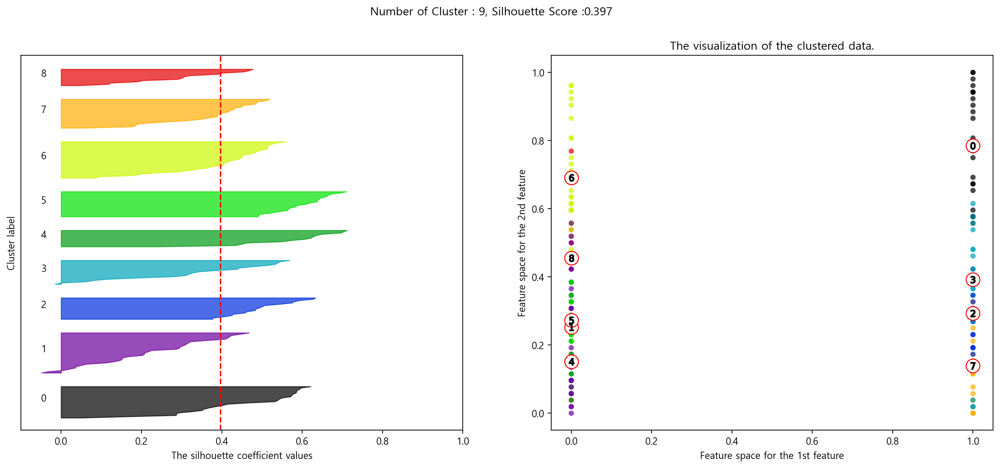

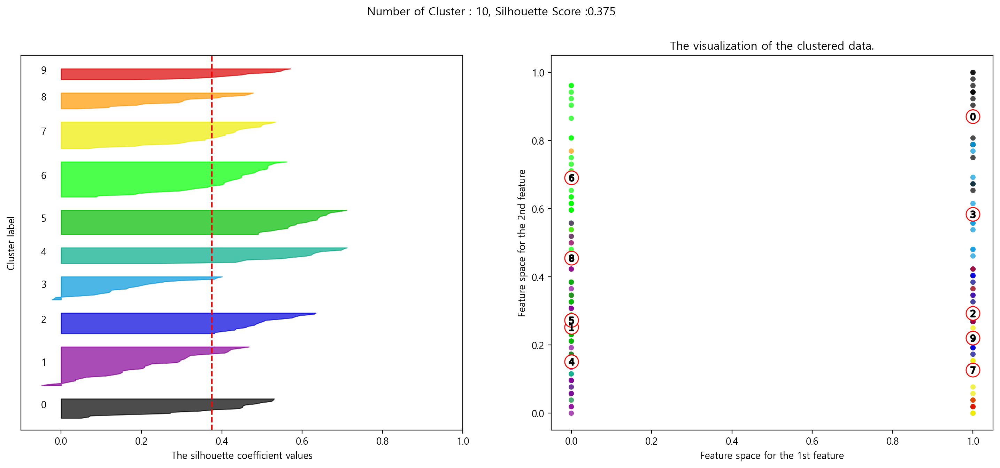

In [14]:
klist = list(range(2, 11))
silhouette = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df1_2)
    cluster = estimator.predict(df1_2)
    silhouette.append(silhouette_score(X=df1_2, labels=cluster, metric='euclidean'))
    
    visualize_silhouette(estimator=estimator, X_features=df1_2, cluster_labels=cluster, n_cluster=k)

- 실루엣 스코어로 판단하였을 경우 k = 3은 클래스간 데이터 갯수의 불균형이 존재
  - k = 2와 k = 4에서 3보다 데이터 개수의 균형이 맞추어져 있었고, 실루엣 스코어는 2 > 3 > 4 순이다.

##### k = 2, 3, 4에 대한 군집별 데이터수 분포 확인

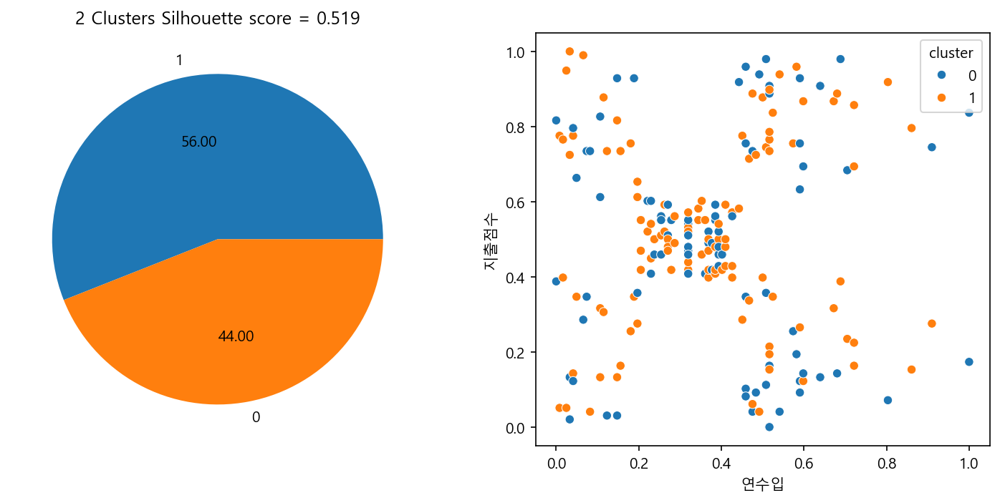

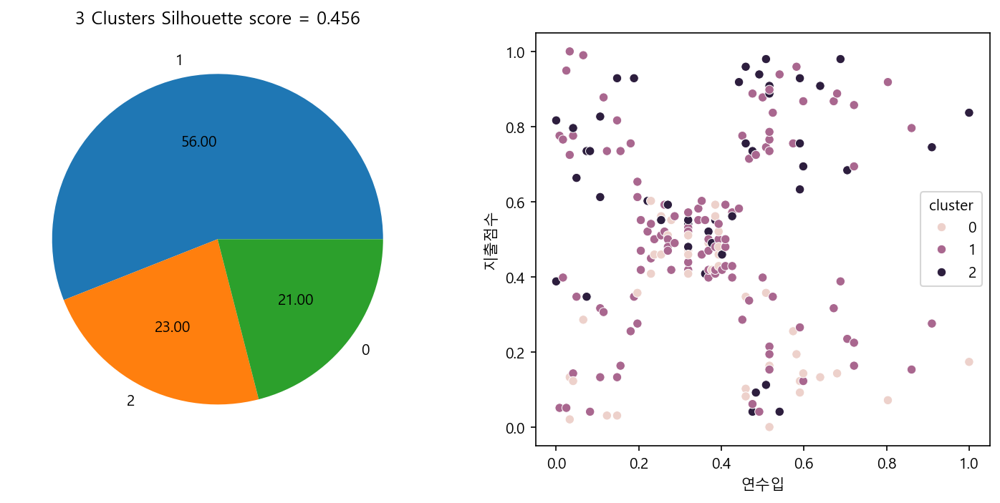

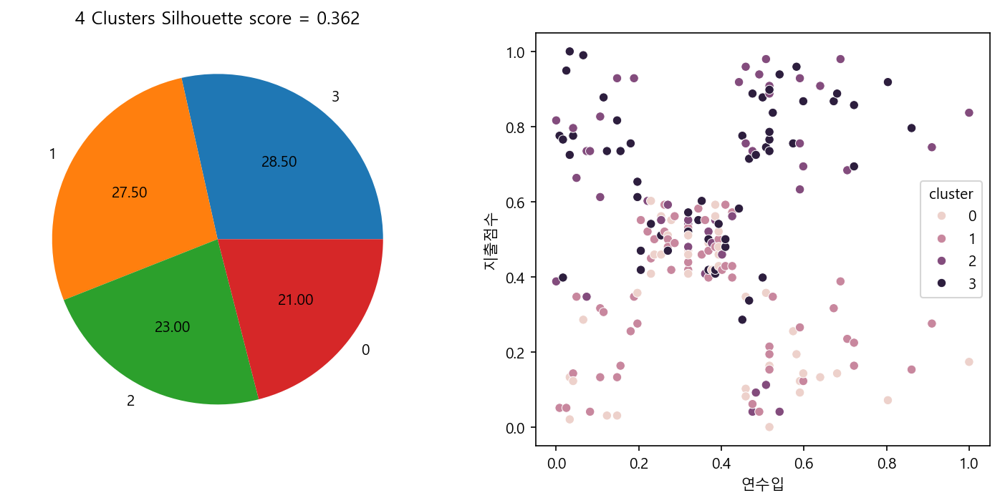

In [15]:
klist = [2, 3, 4]

for i in klist:
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df1_2)
    tmp = df1_2.copy()
    tmp['cluster'] = km.predict(df1_2)
    counts = tmp['cluster'].value_counts()

    fig, ax = plt.subplots(1, 2, figsize = (12, 5), dpi = 150)
    ax[0].pie(x = counts, labels = counts.index, autopct = "%.2f")
    score = silhouette_score(df1_2, labels=km.predict(df1_2), metric='euclidean')
    ax[0].set_title(f"{i} Clusters Silhouette score = {round(score, 3)}")
    sb.scatterplot(data = tmp, x = '연수입', y = '지출점수', hue = 'cluster', ax = ax[1])

- 데이터가 균일하며 실루엣 점수가 높은 k = 2 선정

#### 성별 미사용

In [16]:
df1_3 = df1_2.drop('성별', axis = 1)
df1_3.head()

,나이,연수입,지출점수
0,0.019231,0.000000,0.387755
1,0.057692,0.000000,0.816327
2,0.038462,0.008197,0.051020
3,0.096154,0.008197,0.775510
4,0.250000,0.016393,0.397959


##### Elbow Method

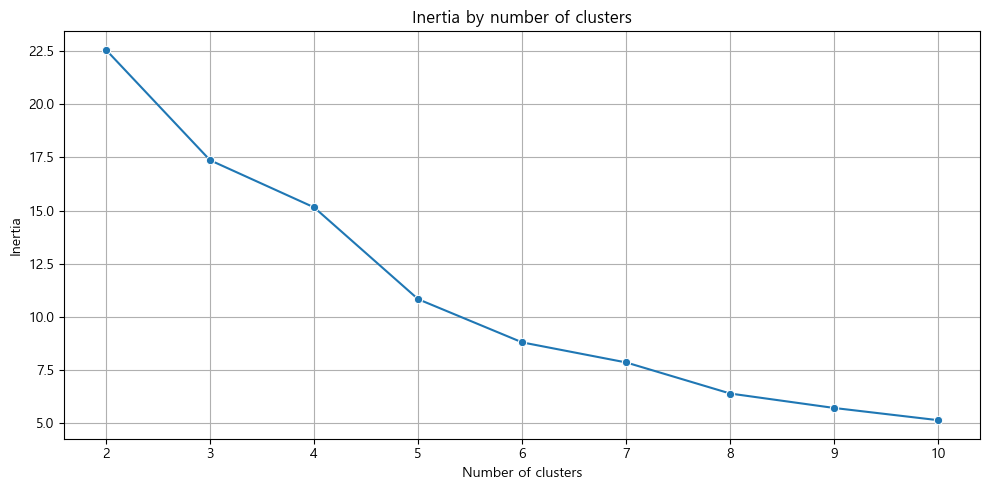

In [17]:
klist = list(range(2, 11))
inertia = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df1_3)
    inertia.append(estimator.inertia_)

def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

In [18]:
change_rates = [0]
for i in range(1, len(inertia)):
    change_rate = (inertia[i] - inertia[i-1]) / inertia[i-1]
    change_rates.append(change_rate)

avg_change_rate = np.mean(change_rates)

elbow_point = next((i for i, rate in enumerate(change_rates) if rate < avg_change_rate), None)

best_k = klist[elbow_point]
best_k

3

In [19]:
change_rates

[0,
 -0.22999337324203517,
 -0.12763116826260076,
 -0.2848676685602662,
 -0.18730201729421056,
 -0.10719852940896951,
 -0.18584804294671906,
 -0.10605303249826988,
 -0.10029277730497034]

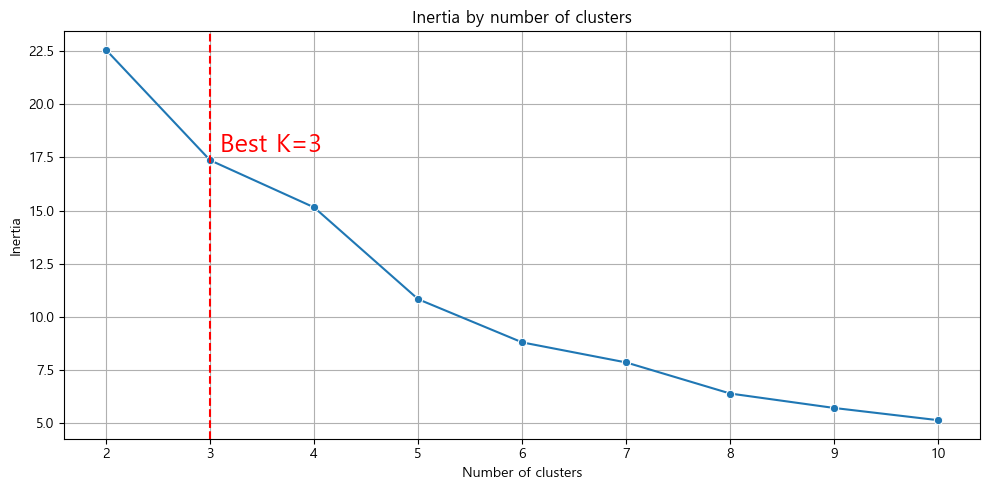

In [20]:
def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')
    ax.axvline(x=klist[elbow_point], color='r', linestyle='--')

    ax.text(
        best_k+0.1, inertia[elbow_point]+0.1, "Best K=%d" % best_k, fontsize=18, ha="left", va="bottom", color="r"
    )

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

- k = 3이 최적의 군집 개수로 선정되었다. k = 5일 경우 또한 실루엣 스코어로 판단해볼 여지가 있다.

##### 실루엣 스코어

In [21]:
estimator = KMeans(n_clusters=3, random_state=0)
estimator.fit(df1_3)
silhouette_samples(df1_3, labels=estimator.predict(df1_3), metric='euclidean')[:5]

array([0.21769396, 0.42823667, 0.1079025 , 0.42219297, 0.03082202])

In [22]:
silhouette_score(df1_3, labels=estimator.predict(df1_3), metric='euclidean')

0.36146237345652027

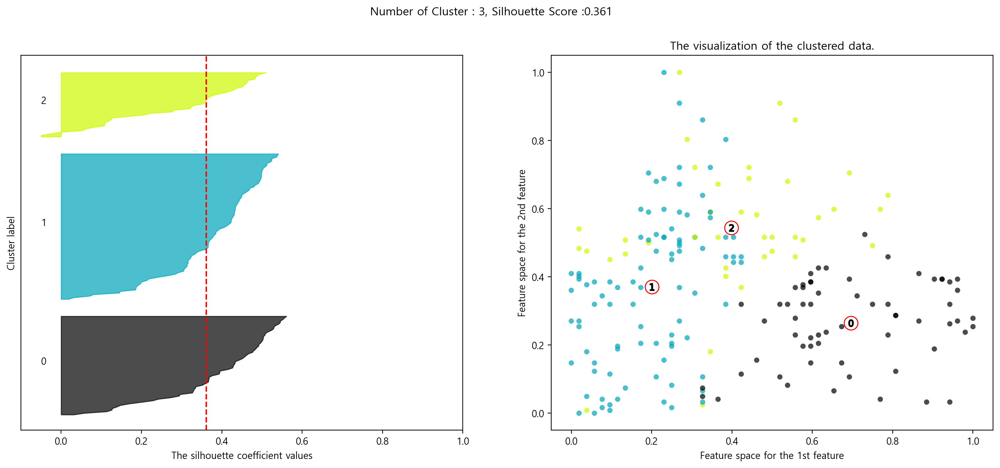

In [23]:
estimator = KMeans(n_clusters=best_k, random_state=0)
estimator.fit(df1_3)

visualize_silhouette(estimator=estimator, X_features=df1_3, cluster_labels=estimator.predict(df1_3), n_cluster=klist[elbow_point])

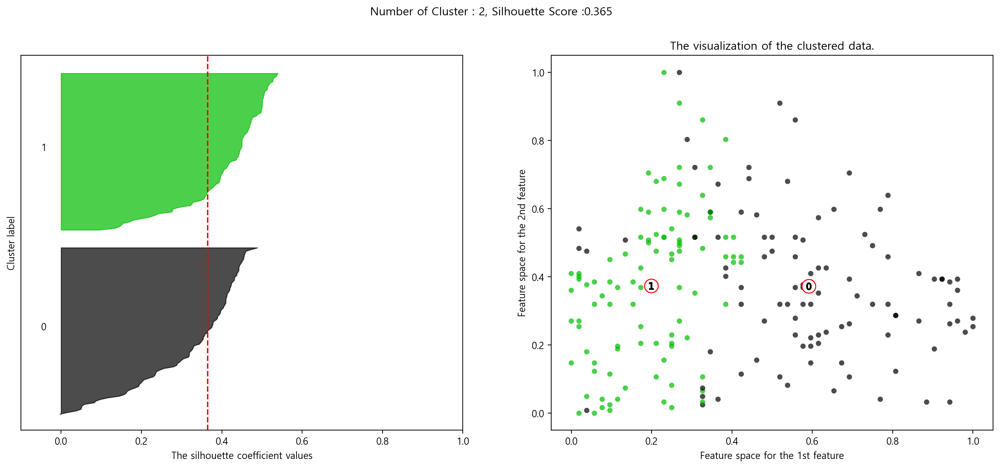

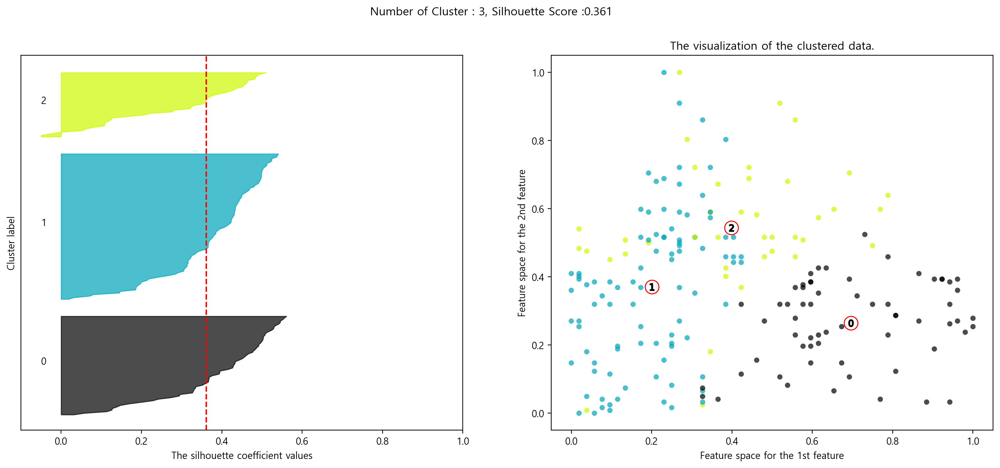

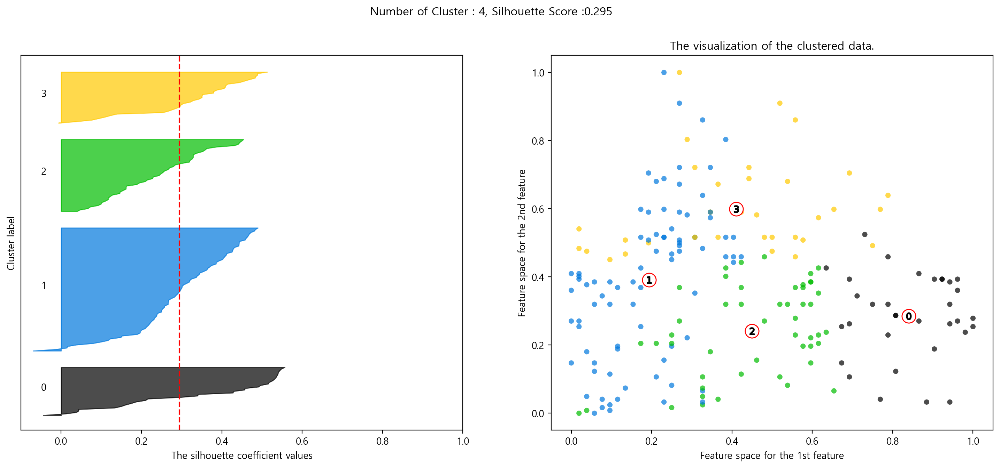

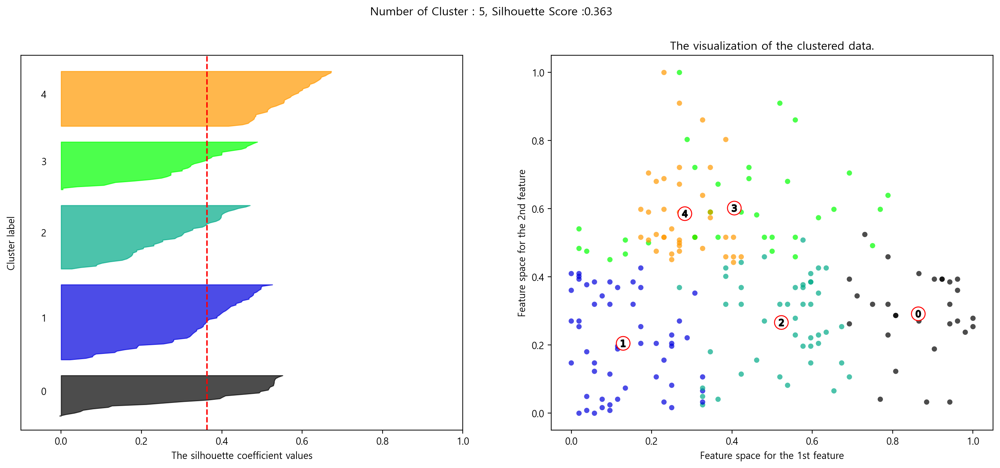

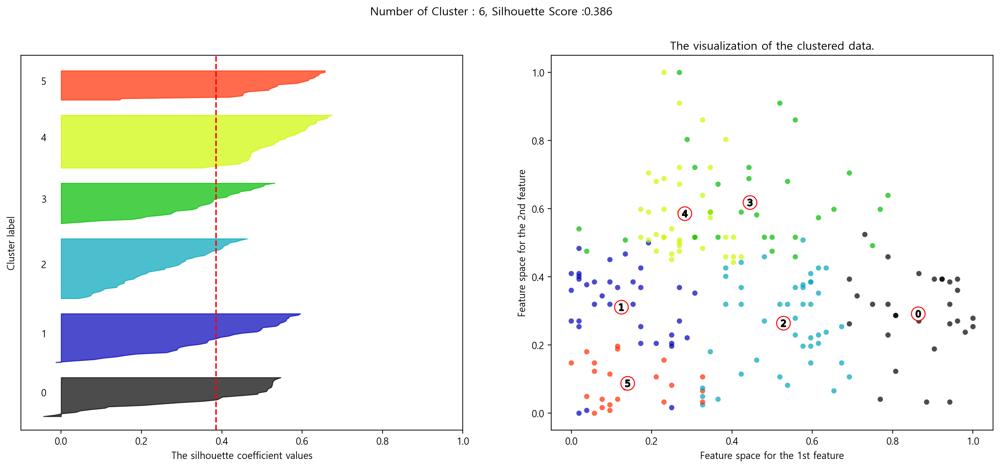

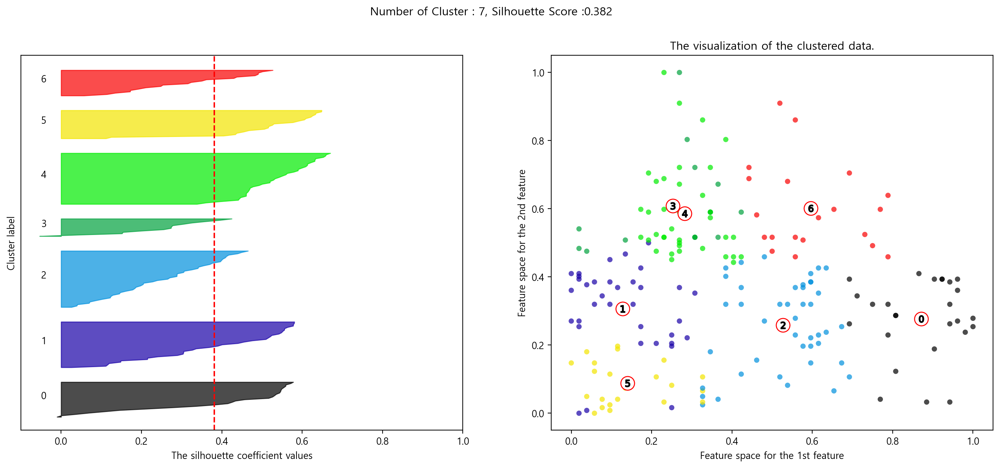

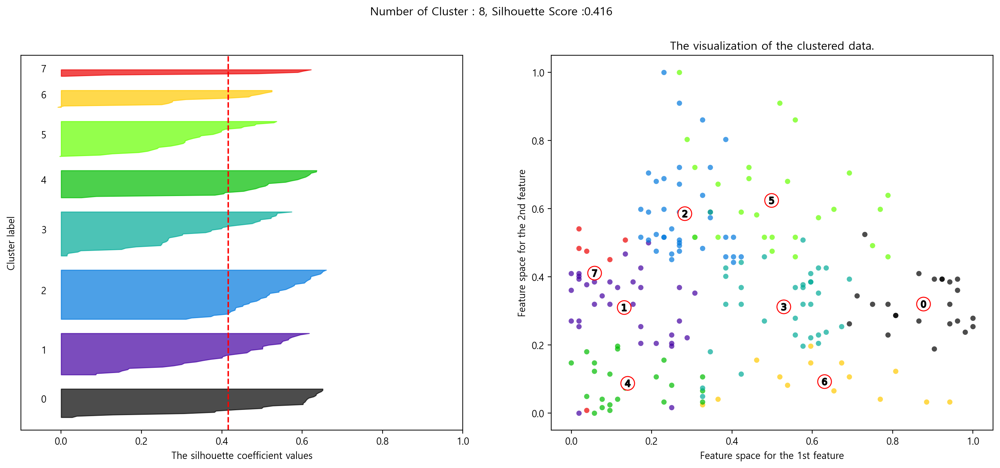

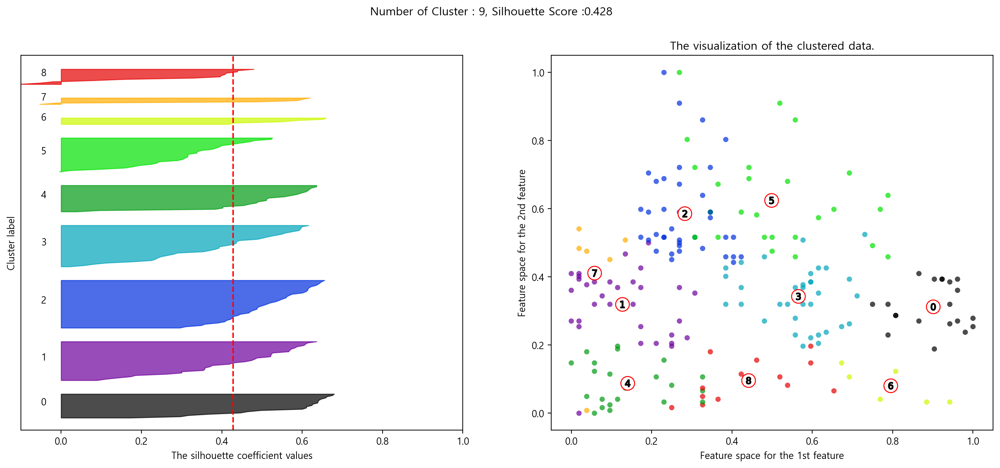

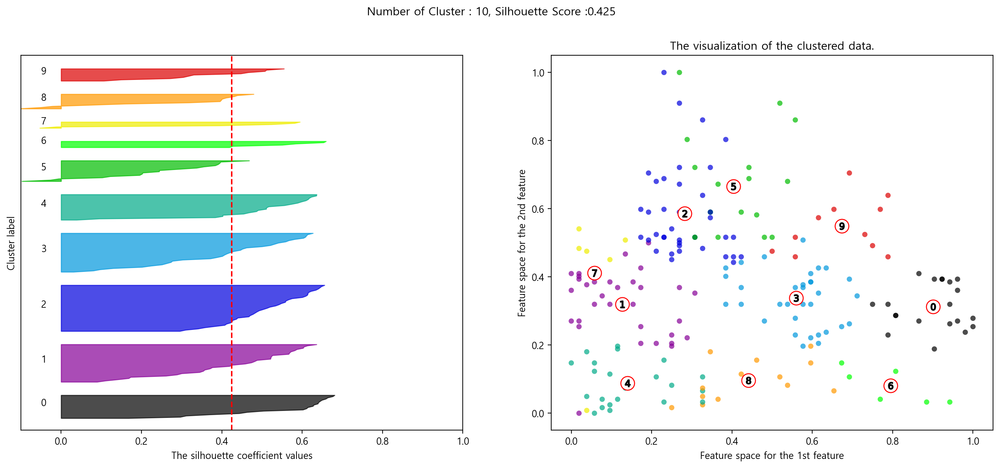

In [24]:
klist = list(range(2, 11))
silhouette = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df1_3)
    cluster = estimator.predict(df1_3)
    silhouette.append(silhouette_score(X=df1_3, labels=cluster, metric='euclidean'))
    
    visualize_silhouette(estimator=estimator, X_features=df1_3, cluster_labels=cluster, n_cluster=k)

- 실루엣 스코어를 이용하였을 경우 클래스간 데이터 균형이 나타나는 군집 개수는 아래와 같다
  - k = 2, 스코어 0.365
  - k = 6, 스코어 0.386

##### k = 2, 3, 6에 대한 군집별 데이터수 분포 확인

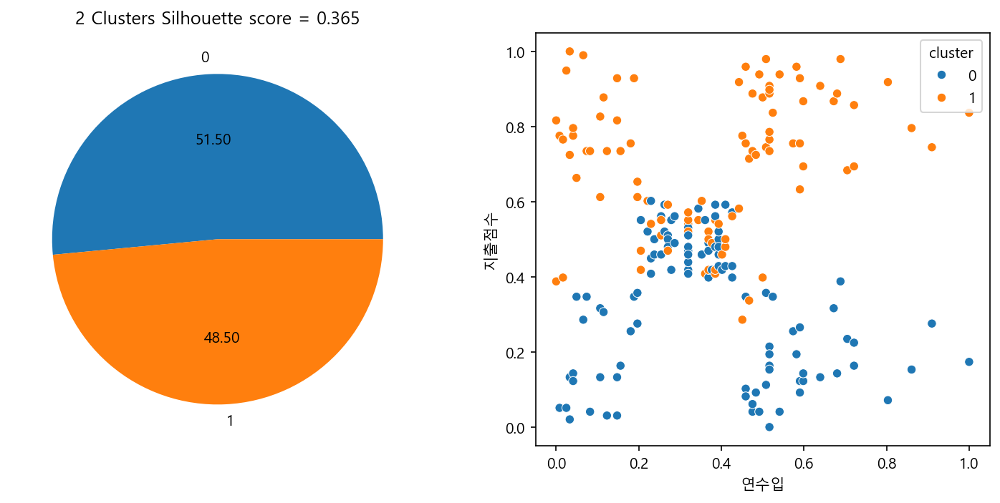

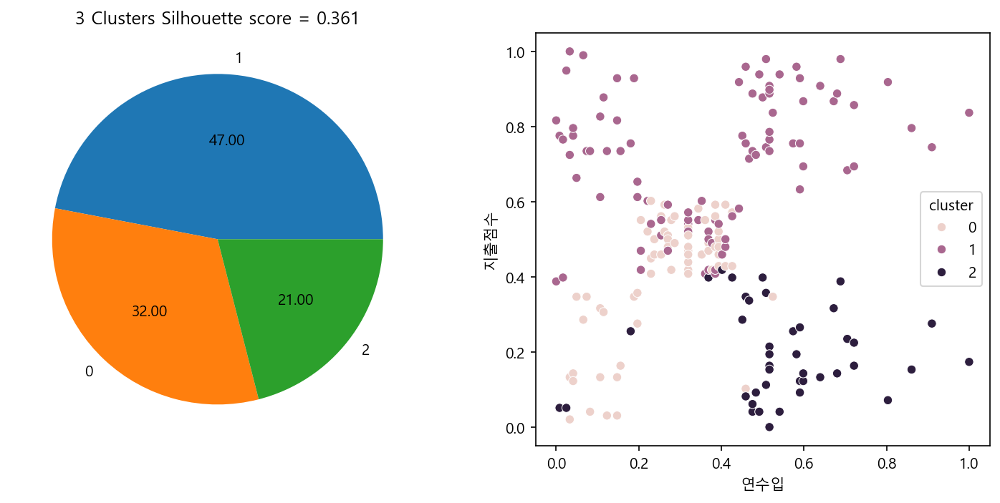

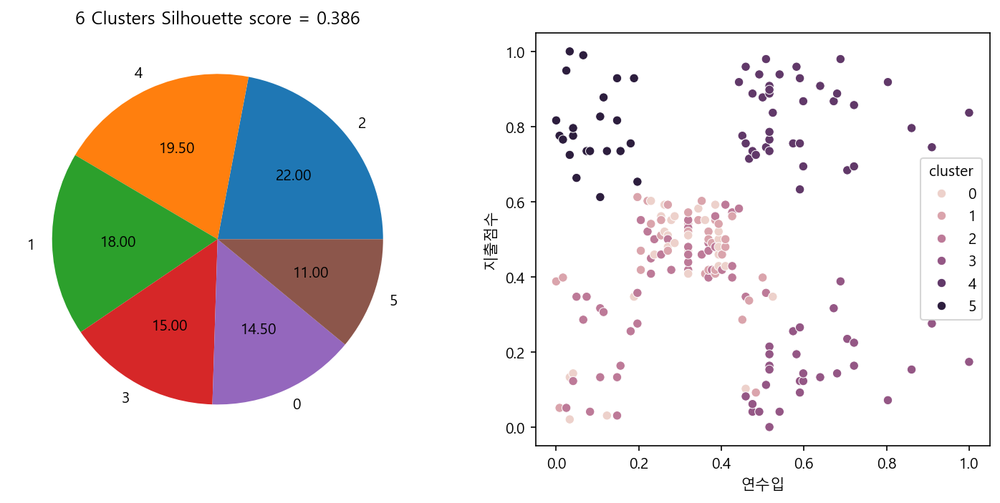

In [25]:
klist = [2, 3, 6]

for i in klist:
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df1_3)
    tmp = df1_3.copy()
    tmp['cluster'] = km.predict(df1_3)
    counts = tmp['cluster'].value_counts()

    fig, ax = plt.subplots(1, 2, figsize = (12, 5), dpi = 150)
    ax[0].pie(x = counts, labels = counts.index, autopct = "%.2f")
    score = silhouette_score(df1_3, labels=km.predict(df1_3), metric='euclidean')
    ax[0].set_title(f"{i} Clusters Silhouette score = {round(score, 3)}")
    sb.scatterplot(data = tmp, x = '연수입', y = '지출점수', hue = 'cluster', ax = ax[1])

- 데이터가 균일하며 실루엣 점수가 높은 k = 6 선정

### 문제 2

In [26]:
origin2 = pd.read_excel("./data/east_west_airlines.xlsx")
origin2.head()

,ID,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1


- ID 삭제

In [27]:
df2_1 = origin2.copy()
df2_1.drop('ID', axis = 1, inplace = True)

df2_2 = my_minmax_scaler(df2_1)
df2_2.head()

,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award
0,0.016508,0.0,0.00,0.0,0.0,0.000660,0.011628,0.000000,0.000000,0.843742,0.0
1,0.011288,0.0,0.00,0.0,0.0,0.000815,0.023256,0.000000,0.000000,0.839884,0.0
2,0.024257,0.0,0.00,0.0,0.0,0.015636,0.046512,0.000000,0.000000,0.847842,0.0
3,0.008667,0.0,0.00,0.0,0.0,0.001896,0.011628,0.000000,0.000000,0.837955,0.0
4,0.057338,0.0,0.75,0.0,0.0,0.164211,0.302326,0.067398,0.075472,0.835905,1.0


#### 1) 전체 데이터 사용

##### Elbow Method

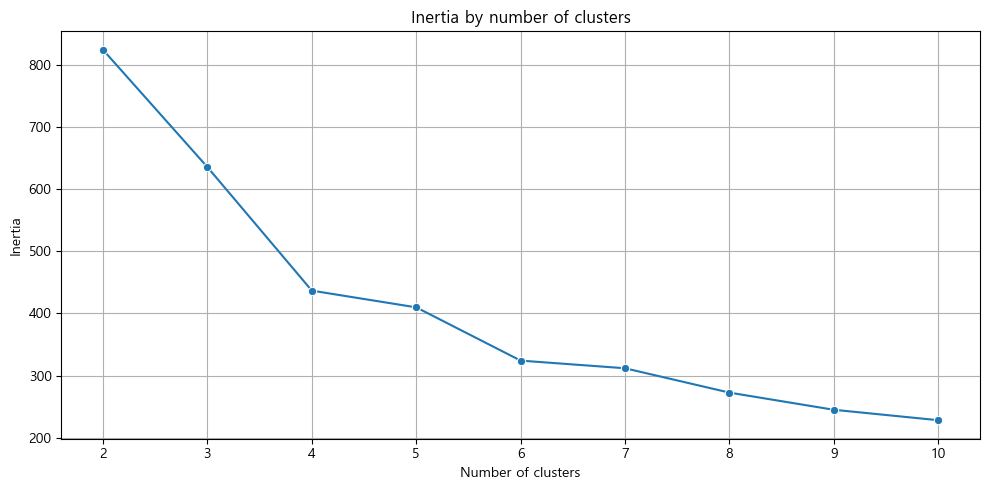

In [28]:
klist = list(range(2, 11))
inertia = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df2_2)
    inertia.append(estimator.inertia_)

def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

In [29]:
change_rates = [0]
for i in range(1, len(inertia)):
    change_rate = (inertia[i] - inertia[i-1]) / inertia[i-1]
    change_rates.append(change_rate)

avg_change_rate = np.mean(change_rates)

elbow_point = next((i for i, rate in enumerate(change_rates) if rate < avg_change_rate), None)

best_k = klist[elbow_point]
best_k

3

In [30]:
change_rates

[0,
 -0.2288031939038218,
 -0.3125034461417037,
 -0.06152124602805428,
 -0.20881077947797938,
 -0.03793069493666623,
 -0.12544897172062328,
 -0.1011071946321962,
 -0.06831330664939422]

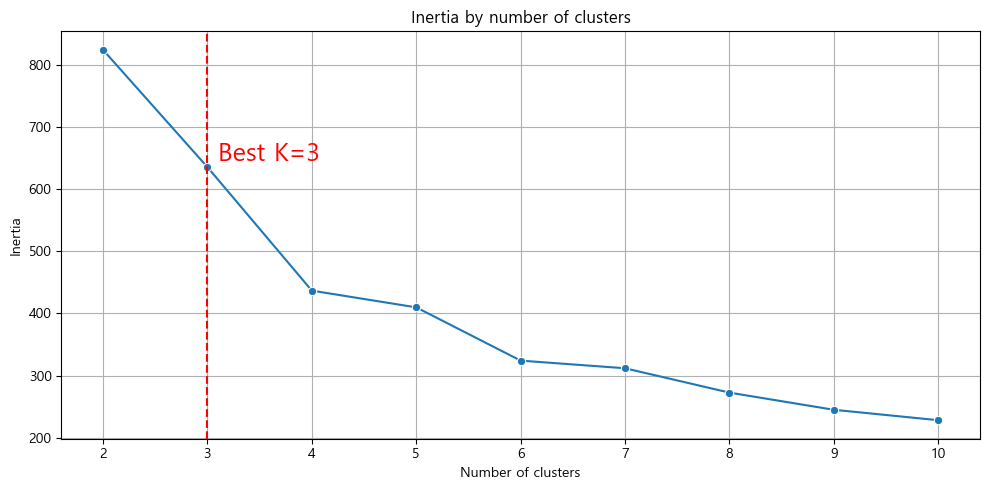

In [31]:
def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')
    ax.axvline(x=klist[elbow_point], color='r', linestyle='--')

    ax.text(
        best_k+0.1, inertia[elbow_point]+0.1, "Best K=%d" % best_k, fontsize=18, ha="left", va="bottom", color="r"
    )

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

- Elbow Method로는 k = 3이 최적의 군집 개수로 산출되었으나 4 등 추가로 살펴볼만한 여지가 있다

##### 실루엣 스코어

In [32]:
estimator = KMeans(n_clusters=3, random_state=0)
estimator.fit(df2_2)
silhouette_samples(df2_2, labels=estimator.predict(df2_2), metric='euclidean')[:5]

array([0.51369782, 0.51680914, 0.51507506, 0.51643875, 0.50891301])

In [33]:
silhouette_score(df2_2, labels=estimator.predict(df2_2), metric='euclidean')

0.5017359816036251

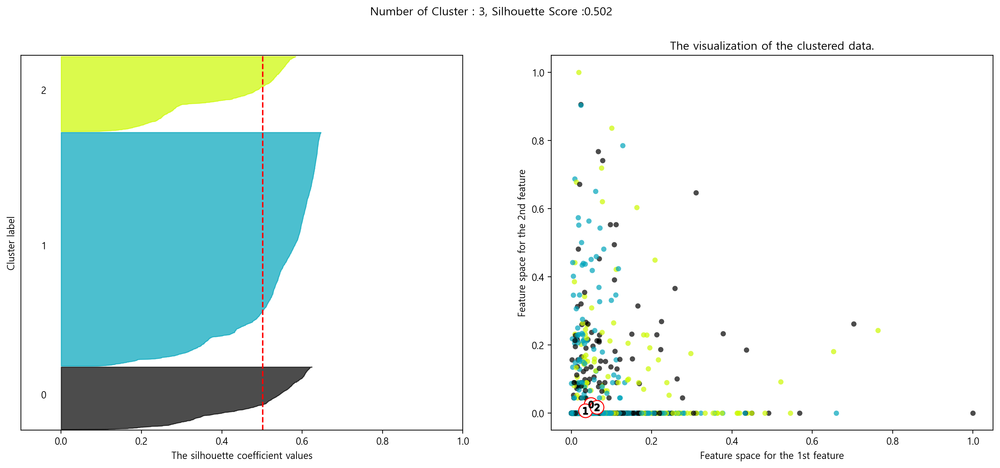

In [34]:
estimator = KMeans(n_clusters=best_k, random_state=0)
estimator.fit(df2_2)

visualize_silhouette(estimator=estimator, X_features=df2_2, cluster_labels=estimator.predict(df2_2), n_cluster=klist[elbow_point])

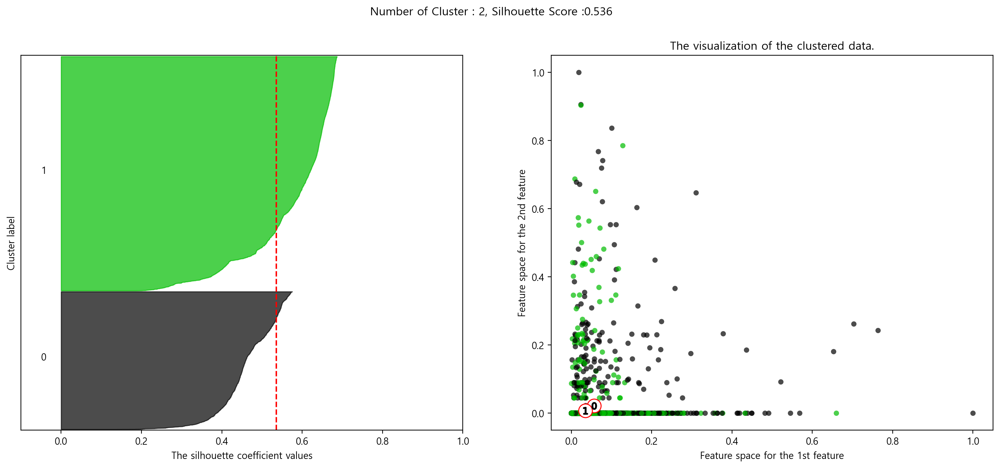

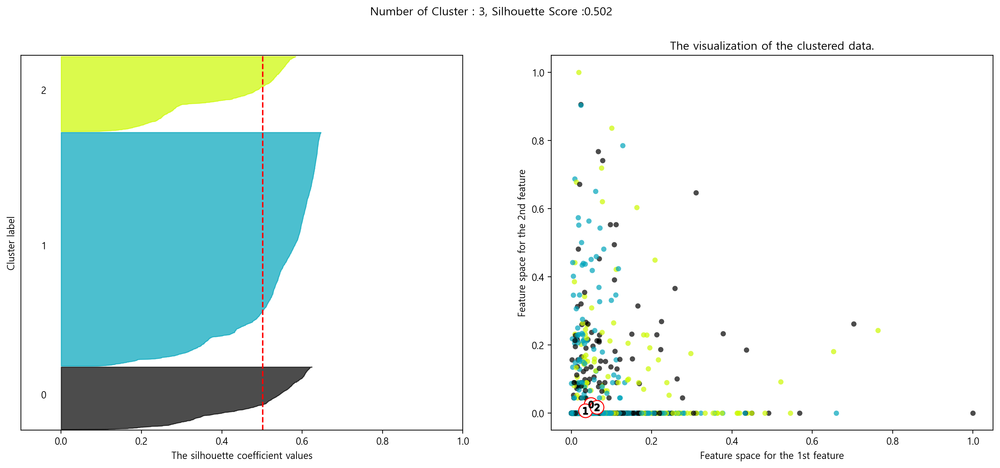

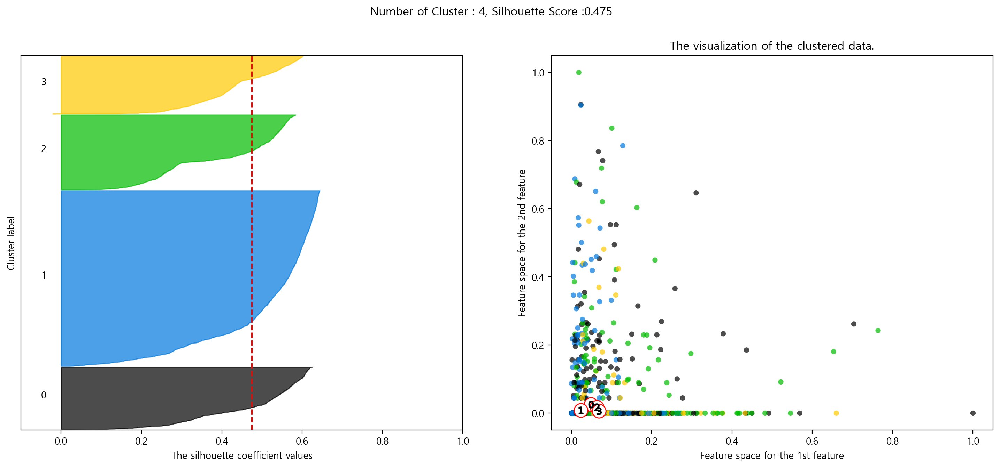

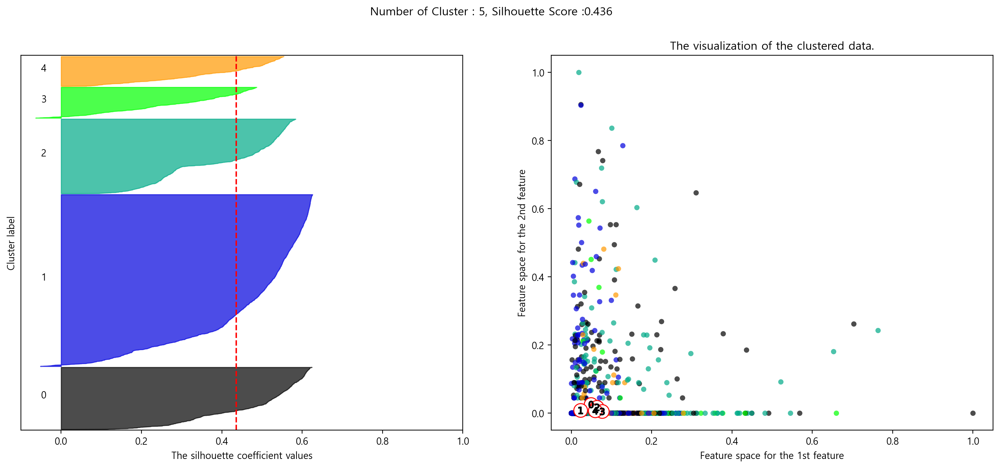

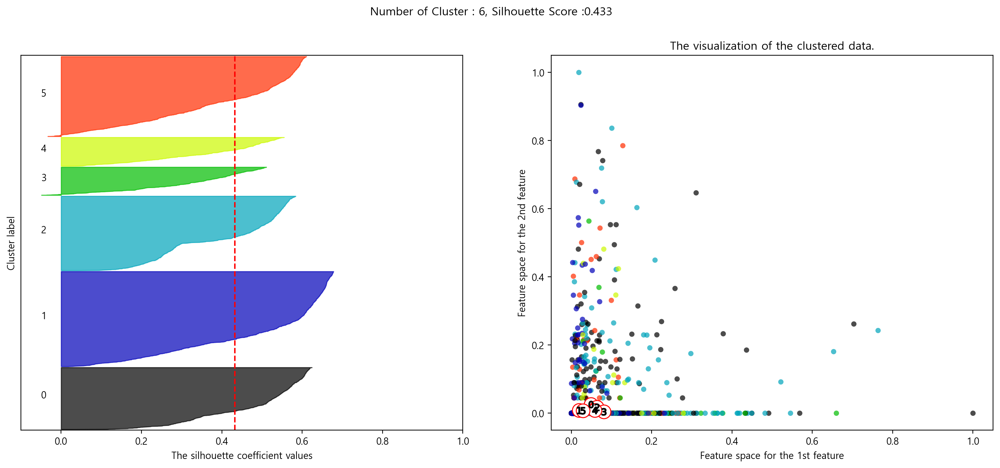

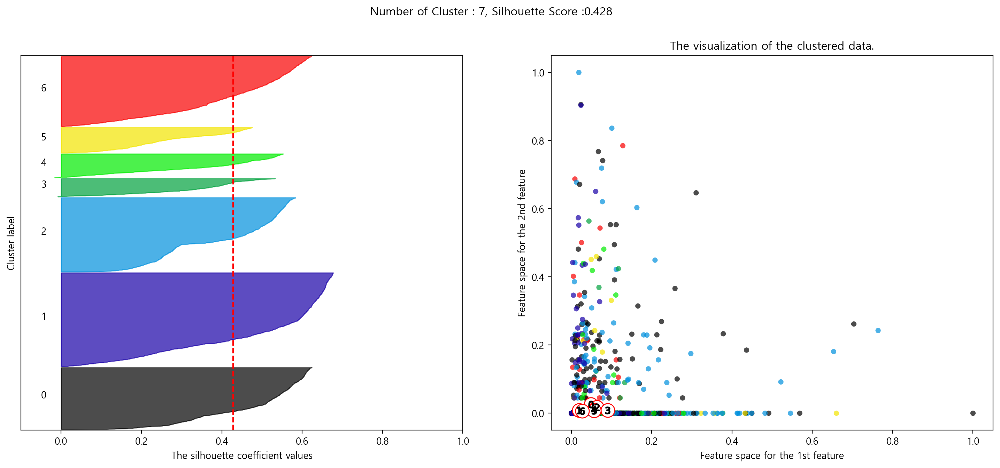

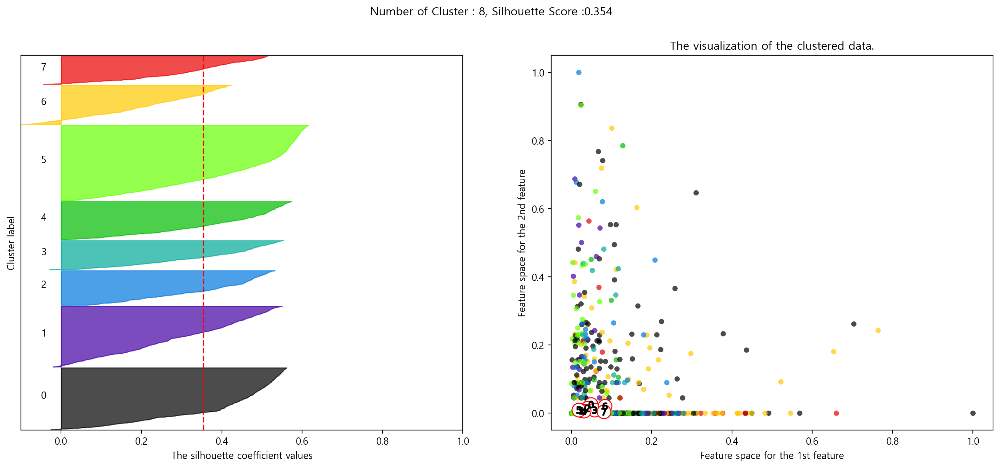

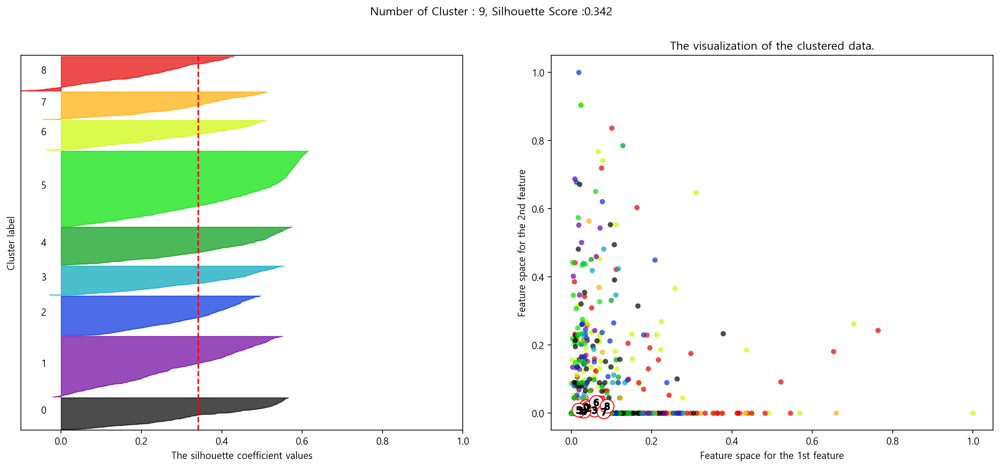

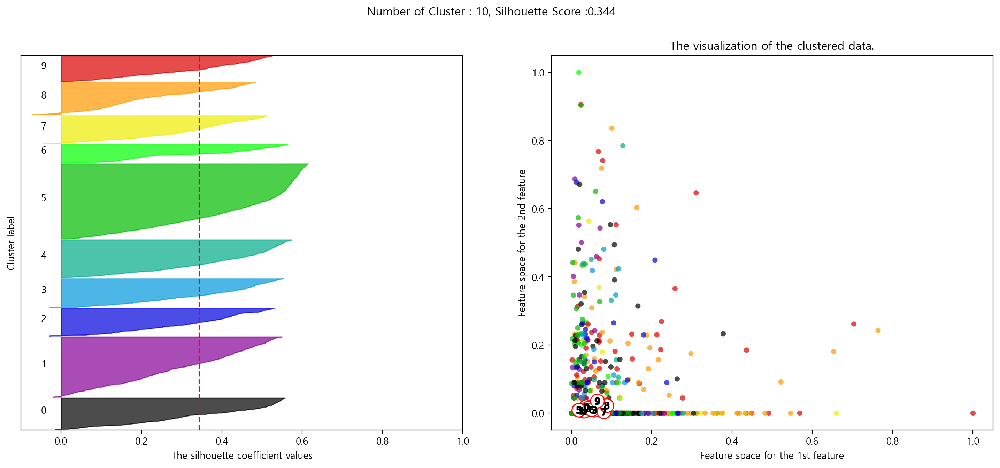

In [35]:
klist = list(range(2, 11))
silhouette = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df2_2)
    cluster = estimator.predict(df2_2)
    silhouette.append(silhouette_score(X=df2_2, labels=cluster, metric='euclidean'))
    
    visualize_silhouette(estimator=estimator, X_features=df2_2, cluster_labels=cluster, n_cluster=k)

- k = 3의 경우 데이터 불균형이 상당하며, 2와 4의 경우에도 데이터 불균형이 확인되나 3만큼은 아닌 것으로 판단됨. 실루엣 스코어는 세 경우 모두 0.5 이상

##### k = 2, 3, 4에 대한 군집별 데이터수 분포 확인

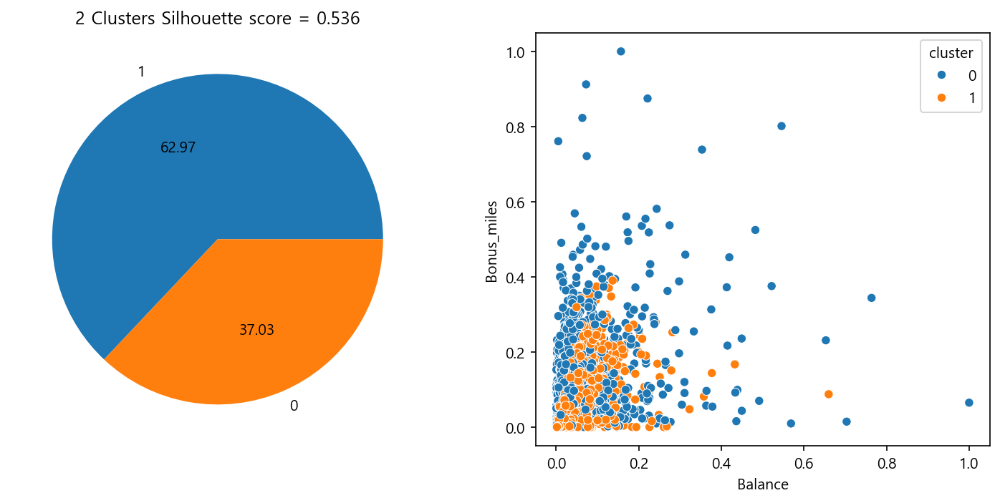

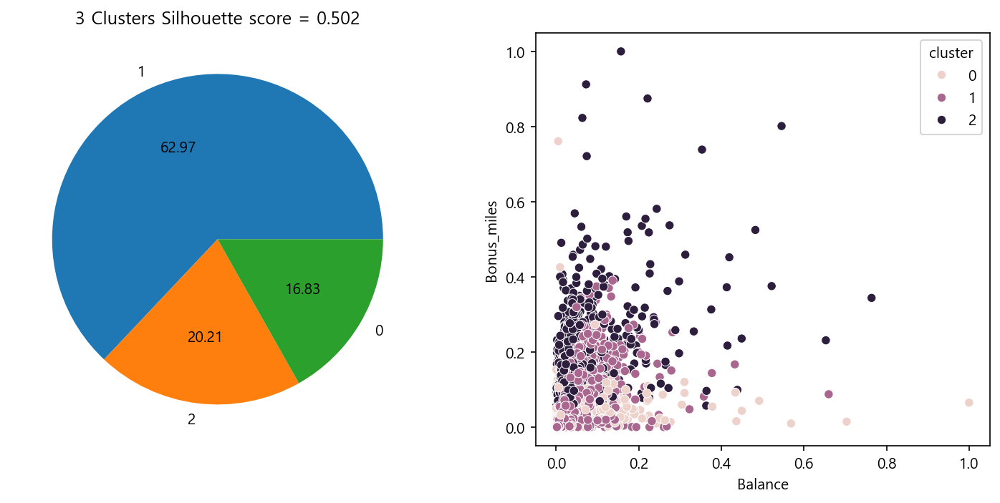

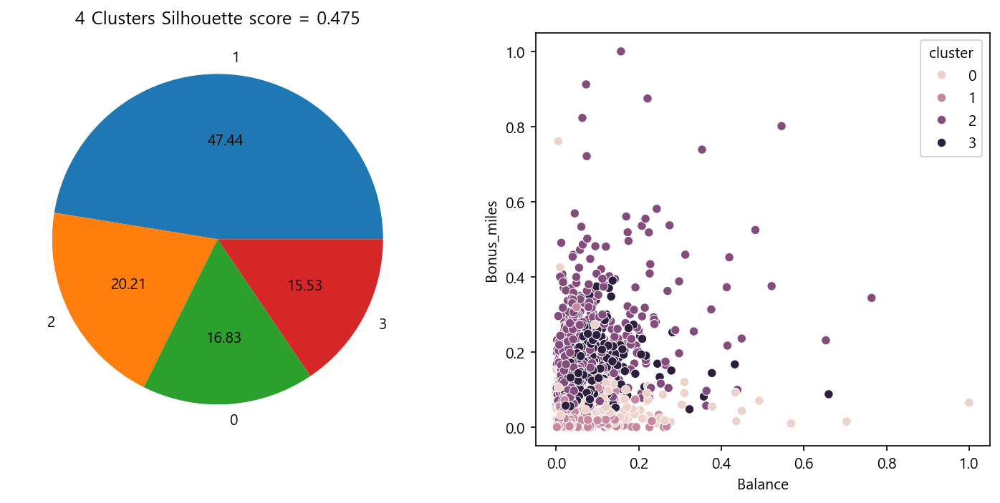

In [36]:
klist = [2, 3, 4]

for i in klist:
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df2_2)
    tmp = df2_2.copy()
    tmp['cluster'] = km.predict(df2_2)
    counts = tmp['cluster'].value_counts()

    fig, ax = plt.subplots(1, 2, figsize = (12, 5), dpi = 150)
    ax[0].pie(x = counts, labels = counts.index, autopct = "%.2f")
    score = silhouette_score(df2_2, labels=km.predict(df2_2), metric='euclidean')
    ax[0].set_title(f"{i} Clusters Silhouette score = {round(score, 3)}")
    sb.scatterplot(data = tmp, x = 'Balance', y = 'Bonus_miles', hue = 'cluster', ax = ax[1])

- 데이터 불균형이 비교적 덜한 k = 2가 가장 적합한 군집화 개수로 판단된다. 이 경우에도 1:2에 가까울 정도로 데이터 불균형이 심하다.

#### 2) VIF가 높은 컬럼 삭제 후 군집화

In [37]:
vif = pd.DataFrame()
vif["Feature"] = df2_2.columns
vif["VIF"] = [variance_inflation_factor(df2_2.values, i) for i in range(df2_2.shape[1])]
vif.round(2)

,Feature,VIF
0,Balance,2.01
1,Qual_miles,1.07
2,cc1_miles,6.54
3,cc2_miles,1.04
4,cc3_miles,1.11
5,Bonus_miles,5.91
6,Bonus_trans,4.80
7,Flight_miles_12mo,4.57
8,Flight_trans_12,5.14
9,Days_since_enroll,2.65


- VIF 5 이상인 컬럼을 차례로 삭제하여 데이터 정제

In [38]:
df2_3 = df2_2.copy()
del_li = []

while True:
    vif = pd.DataFrame()
    vif["Feature"] = df2_3.columns
    vif["VIF"] = [variance_inflation_factor(df2_3.values, i) for i in range(df2_3.shape[1])]
    del_idx = vif['VIF'].argmax()

    if vif.loc[del_idx, 'VIF'] < 5:
        break

    del_col = vif.loc[del_idx, 'Feature']
    del_li.append(del_col)
    df2_3.drop(del_col, axis = 1, inplace = True)
    df2_3.reset_index(drop = True, inplace = True)

print(f"삭제한 컬럼 : {del_li}")

삭제한 컬럼 : ['cc1_miles', 'Flight_trans_12']


In [39]:
df2_3.head()

,Balance,Qual_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Days_since_enroll,Award
0,0.016508,0.0,0.0,0.0,0.000660,0.011628,0.000000,0.843742,0.0
1,0.011288,0.0,0.0,0.0,0.000815,0.023256,0.000000,0.839884,0.0
2,0.024257,0.0,0.0,0.0,0.015636,0.046512,0.000000,0.847842,0.0
3,0.008667,0.0,0.0,0.0,0.001896,0.011628,0.000000,0.837955,0.0
4,0.057338,0.0,0.0,0.0,0.164211,0.302326,0.067398,0.835905,1.0


##### Elbow Method

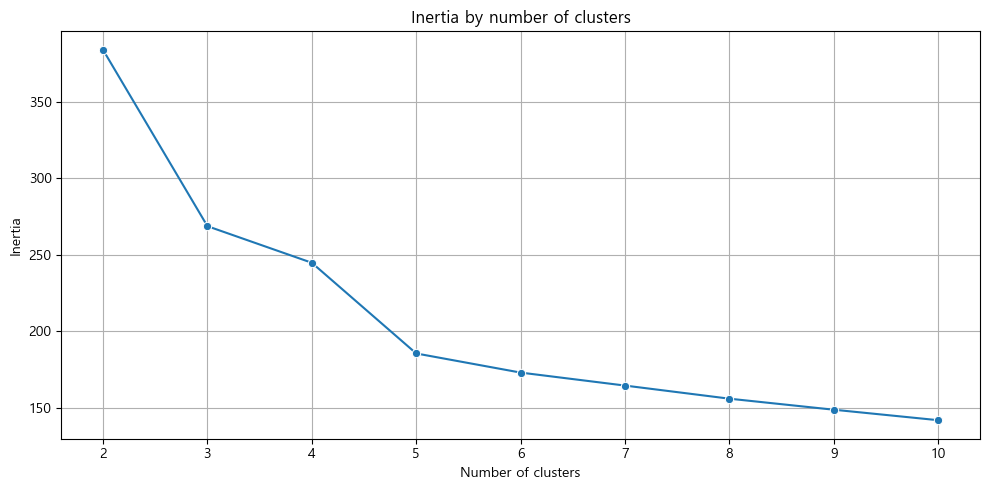

In [40]:
klist = list(range(2, 11))
inertia = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df2_3)
    inertia.append(estimator.inertia_)

def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

In [41]:
change_rates = [0]
for i in range(1, len(inertia)):
    change_rate = (inertia[i] - inertia[i-1]) / inertia[i-1]
    change_rates.append(change_rate)

avg_change_rate = np.mean(change_rates)

elbow_point = next((i for i, rate in enumerate(change_rates) if rate < avg_change_rate), None)

best_k = klist[elbow_point]
best_k

3

In [42]:
change_rates

[0,
 -0.3004355453799665,
 -0.08912707299549909,
 -0.24246760700173578,
 -0.06750039763934468,
 -0.049136262612229704,
 -0.05223490444094751,
 -0.0463065657881271,
 -0.0461789558617579]

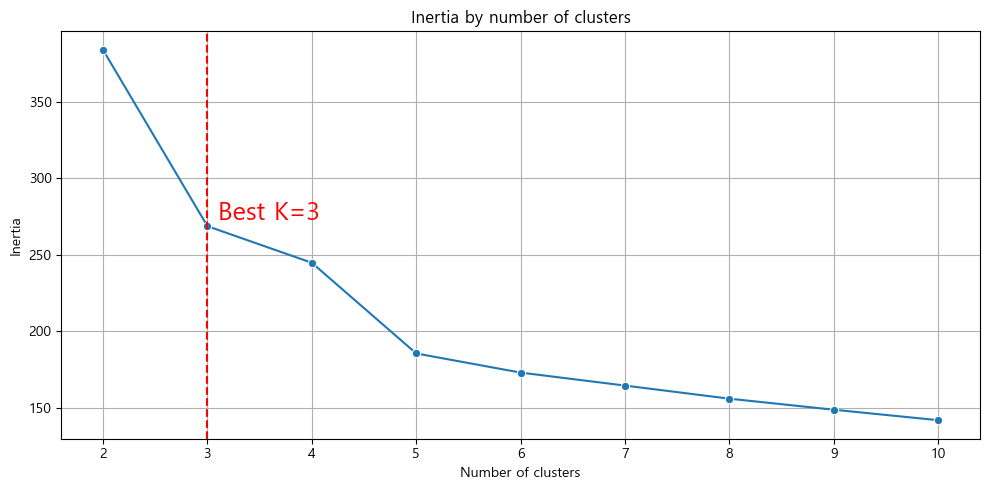

In [43]:
def my_callback(ax):
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Inertia')
    ax.set_title('Inertia by number of clusters')
    ax.axvline(x=klist[elbow_point], color='r', linestyle='--')

    ax.text(
        best_k+0.1, inertia[elbow_point]+0.1, "Best K=%d" % best_k, fontsize=18, ha="left", va="bottom", color="r"
    )

my_lineplot(df=None, xname=klist, yname=inertia, marker="o", callback=my_callback)

- Elbow Method로는 k = 3이 최적의 군집 개수로 산출되었다. 5의 경우에도 검토가 필요하다.

##### 실루엣 스코어

In [44]:
estimator = KMeans(n_clusters=3, random_state=0)
estimator.fit(df2_3)
silhouette_samples(df2_3, labels=estimator.predict(df2_3), metric='euclidean')[:5]

array([0.57660262, 0.58239357, 0.5941904 , 0.57671701, 0.60964164])

In [45]:
silhouette_score(df2_3, labels=estimator.predict(df2_3), metric='euclidean')

0.5171132089697951

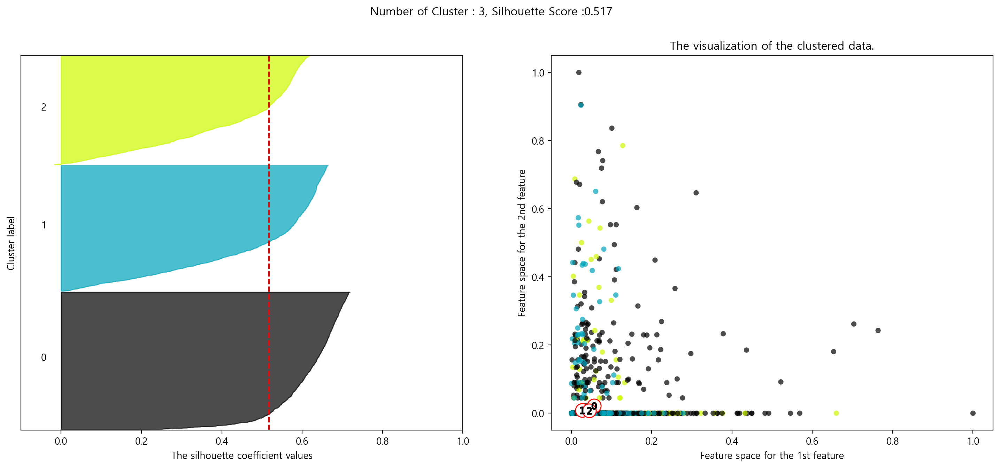

In [46]:
estimator = KMeans(n_clusters=best_k, random_state=0)
estimator.fit(df2_3)

visualize_silhouette(estimator=estimator, X_features=df2_3, cluster_labels=estimator.predict(df2_3), n_cluster=klist[elbow_point])

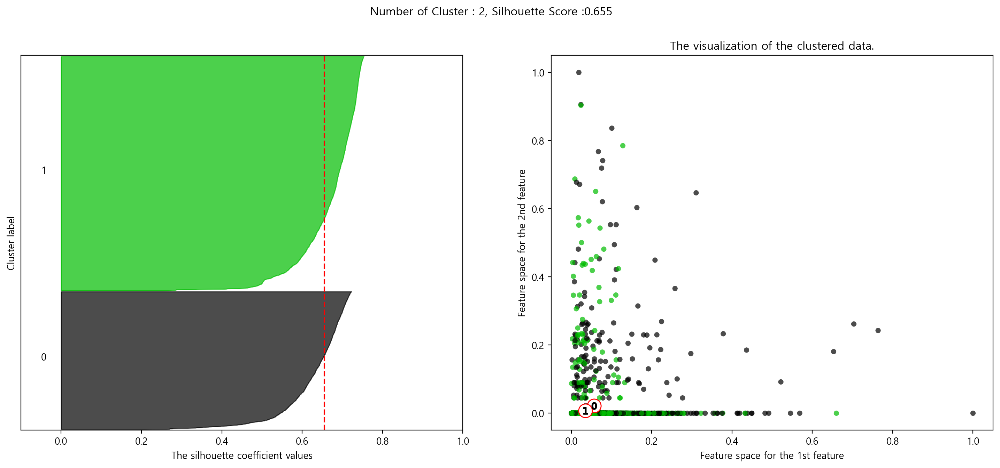

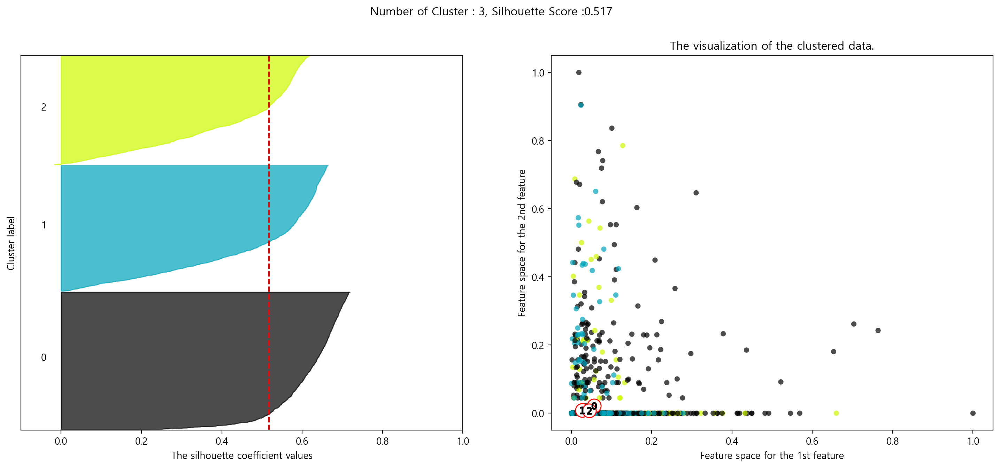

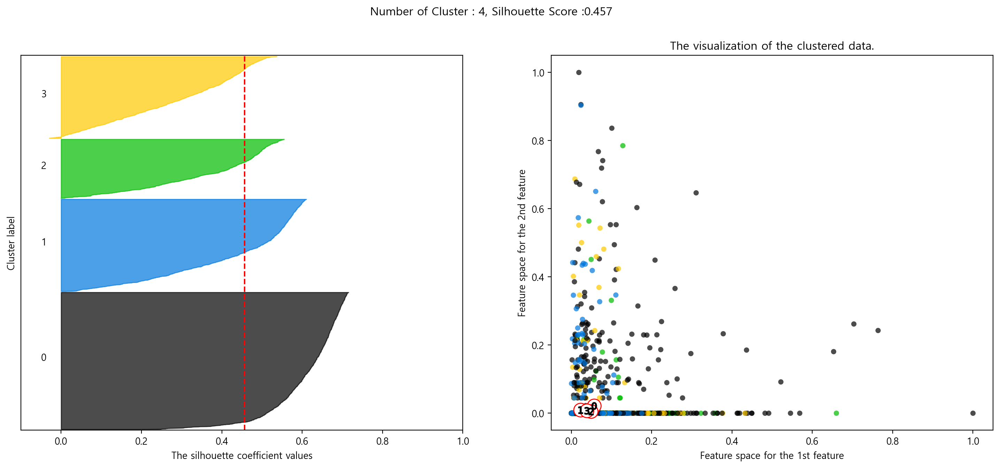

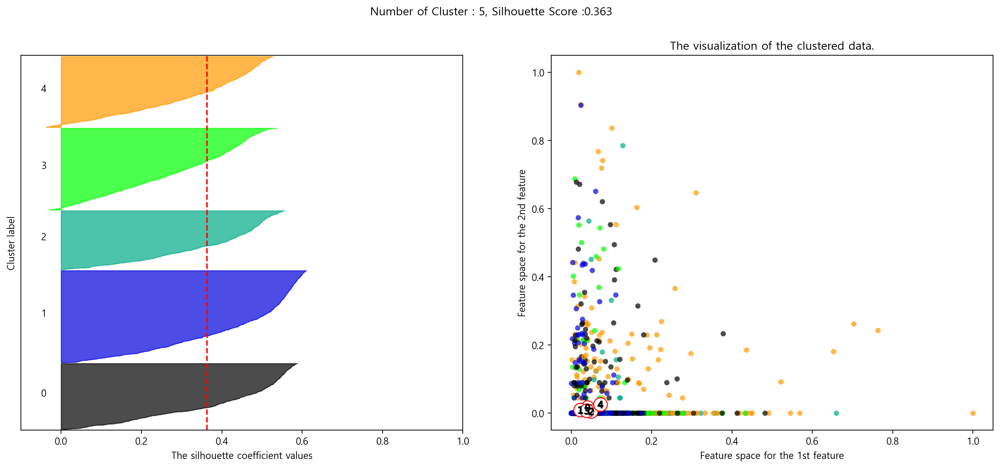

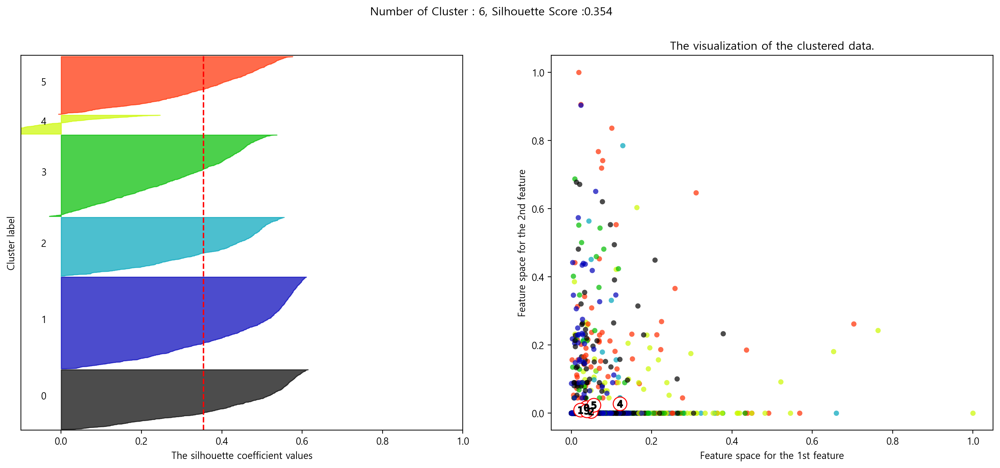

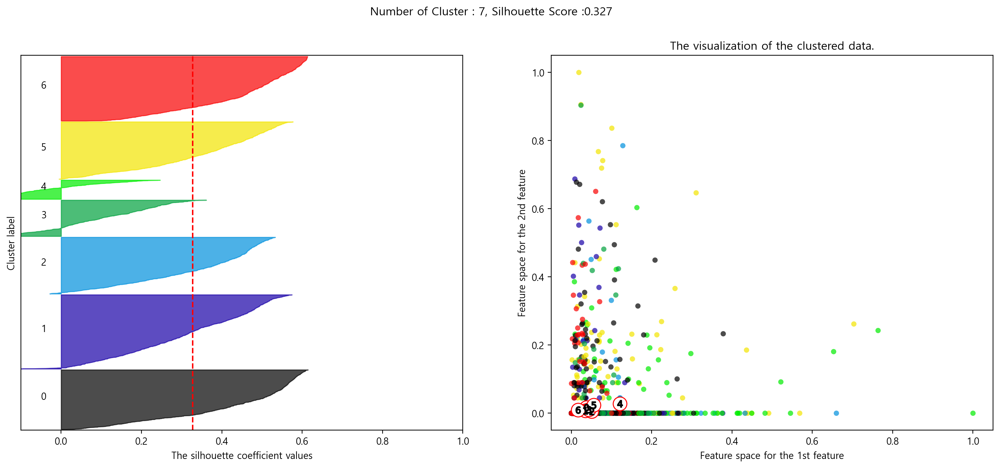

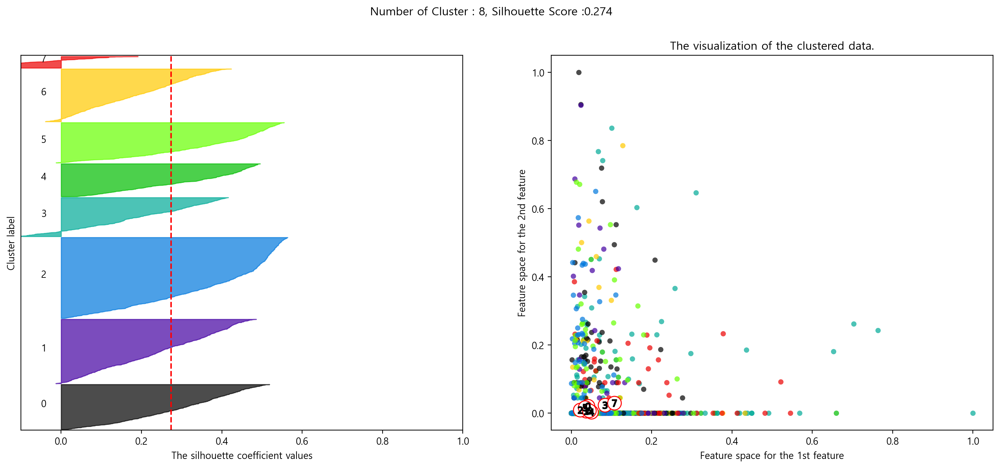

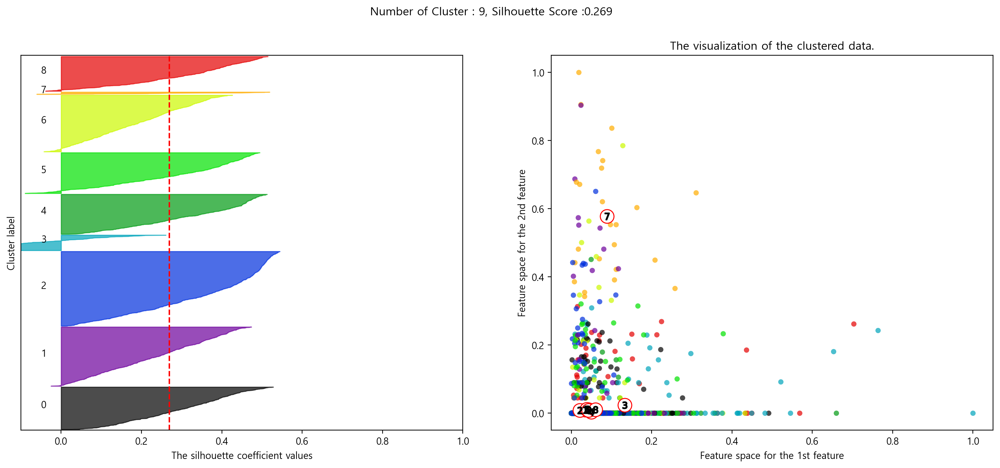

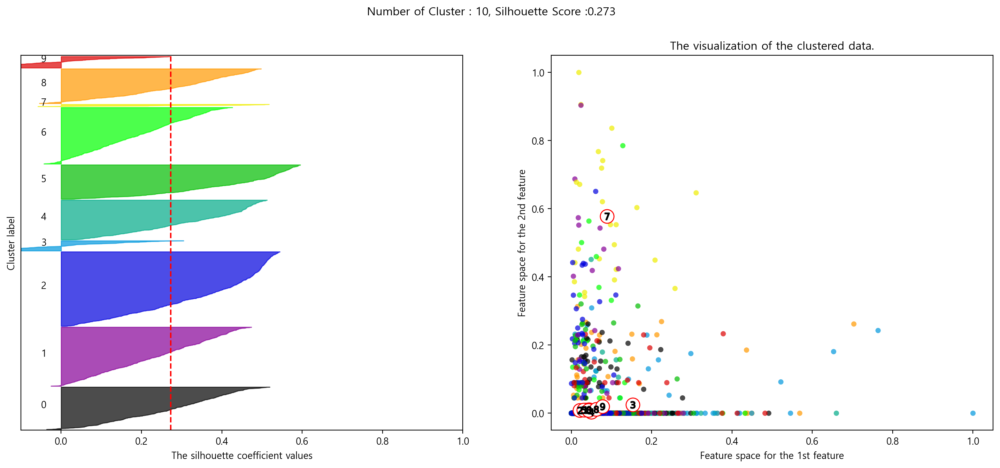

In [47]:
klist = list(range(2, 11))
silhouette = []   # inertia값을 저장할 리스트

for k in klist:
    estimator = KMeans(n_clusters=k, random_state=0)
    estimator.fit(df2_3)
    cluster = estimator.predict(df2_3)
    silhouette.append(silhouette_score(X=df2_3, labels=cluster, metric='euclidean'))
    
    visualize_silhouette(estimator=estimator, X_features=df2_3, cluster_labels=cluster, n_cluster=k)

- 실루엣 스코어가 0.5 이상인 k는 2, 3이며 3의 경우 데이터가 더 균일한 분포인 것으로 보인다.

##### k = 2, 3에 대한 군집별 데이터수 분포 확인

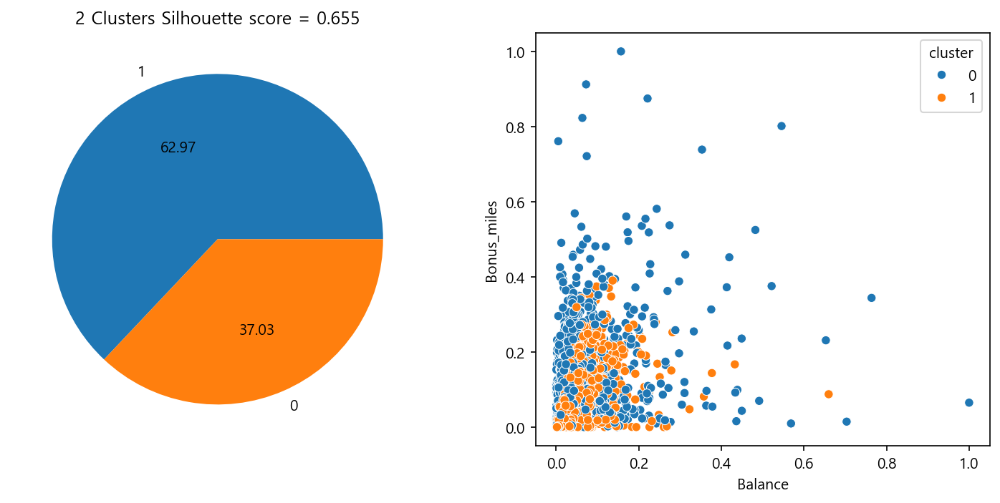

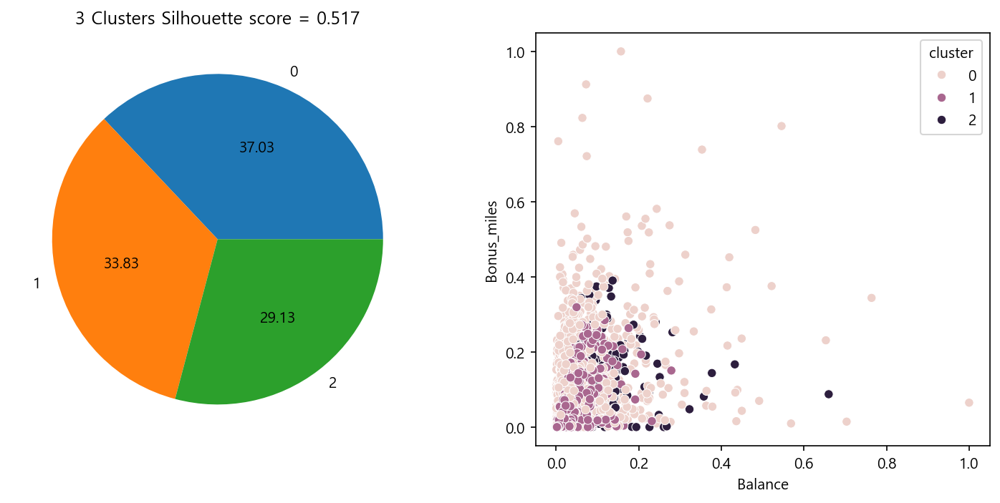

In [48]:
klist = [2, 3]

for i in klist:
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(df2_3)
    tmp = df2_3.copy()
    tmp['cluster'] = km.predict(df2_3)
    counts = tmp['cluster'].value_counts()

    fig, ax = plt.subplots(1, 2, figsize = (12, 5), dpi = 150)
    ax[0].pie(x = counts, labels = counts.index, autopct = "%.2f")
    score = silhouette_score(df2_3, labels=km.predict(df2_3), metric='euclidean')
    ax[0].set_title(f"{i} Clusters Silhouette score = {round(score, 3)}")
    sb.scatterplot(data = tmp, x = 'Balance', y = 'Bonus_miles', hue = 'cluster', ax = ax[1])

- k = 3에서 데이터 분포가 더 균일하면서 0.5 이상의 실루엣 스코어를 확보하였다. 전체 데이터를 삭제했을 때 보다 데이터가 균등한 분포를 보여 군집화 성능이 향상되었다고 볼 수 있다.